# 1.1 A general biophysical model

This notebook describes the equations and parameters of the general biophysical (or conductance-based) model used in this book. It then permits to simulate the model in both current-clamp and voltage-clamp modes. 

This notebook uses the packages "DifferentialEquations.jl", "Plots.jl" and "LaTeXStrings.jl". You can run the following code in Julia to install these packages if needed:

```julia
using Pkg
Pkg.add("DifferentialEquations")
Pkg.add("Plots")
Pkg.add("LaTeXStrings")
```


In [2]:
using DifferentialEquations, Plots, Plots.PlotMeasures, LaTeXStrings

# Conductance-based modeling
A general, single compartment biophysical neuron model consists of the voltage-current equation

\begin{eqnarray}
C \dot V = - \bar{G}_{l}(V-E_{l}) - I_{int}(V,t) + I_{ext}(t)
\end{eqnarray}

where $V$ is the membrane potential, $C$ the membrane capacitance, the term $\bar{G}_{l}(V-E_{l})$ models the passive leak current, $I_{int}(V,t)$ is the internal current and $I_{ext}(t)$ any externally applied current. The internal current $I_{int}(V,t)$ is described as a sum of independent voltage-dependent current sources

\begin{eqnarray}
I_{int}(V,t) = \sum_i I_{i}(V,t) = \sum_i G_{i}(V,t)(V-E_i)
\end{eqnarray}

each modeling a specific ion channel type. $I_{int}(V,t)$ is composed of as many voltage-dependent current sources as there are voltage-gated channel types embedded in neuron membrane. These channels are called "voltage-dependent" because their conductance $G_{i}(V,t)$ dependents on time and voltage. 

A specific conductance-based model is characterized by the specific set of voltage-dependent current sources used to describe $I_{int}(V,t)$, each channel being defined by its ionic permeability (affecting the reversal potential $E_i$) and the dynamics of its voltage-gated conductance $G_{i}(V,t)$. The dynamics of $G_{i}(V,t)$ is usually modeled as

\begin{eqnarray}
G_{i}(V,t) = \bar{G}_i m_i^p h_i^q 
\end{eqnarray}

where $\bar{G}_i$ is the channel maximal conductance, $m_i \in [0,1]$ its activation gate and $h_i \in [0,1]$ its inactivation gate and $p,q$ are two integer exponents. An activation gate opens as $V$ increases (activation) and closes as $V$ decreases (deactivation). An inactivation gate closes as $V$ increases (inactivation) and opens as $V$ decreases (deinactivation). The dynamics of each activation/inactivation gate is modeled by the ODE

\begin{eqnarray}
\dot{m}_{i} = \frac{m_{i,\infty}(V)-m_i}{\tau_{m_i}(V)}
\end{eqnarray}

where $m_{i,\infty}(V)$ is a voltage dependent, steady-state activation function and $\tau_{m_i}(V)$ a voltage-dependent time constant. It leads to the conductance-based model described by the set of ODEs

\begin{eqnarray}
C \dot V &=& - \bar{G}_{leak}(V-E_{leak}) - \sum_i \bar{G}_i m_i^p h_i^q (V-E_i) + I_{ext}(t)\\
\dot{m}_{i} &=& \frac{m_{i,\infty}(V)-m_i}{\tau_{m_i}(V)} \quad\mbox{for } i=1:n\\
\dot{h}_{i} &=& \frac{h_{i,\infty}(V)-h_i}{\tau_{h_i}(V)} \quad\mbox{for } i=1:n
\end{eqnarray}

# Model definition
The general biophysical model used in this book is composed of seven voltage-gated currents and one calcium-gated current. It is described by the voltage-current equation

\begin{eqnarray}
C \dot V = &-& \bar{G}_{l}(V-E_{l}) - G_{Na}(V,t)(V-E_{Na}) - G_{K,d}(V-E_K) - G_{A,f}(V-E_K) - G_{A,s}(V-E_K) \\
            &-& G_{Ca,T}(V-E_{Ca}) - G_{Ca,L}(V-E_{Ca}) - G_{H}(V,t)(V-E_H) - G_{K,Ca}([Ca^{2+}]_{in},t)(V-E_K) + I_{ext}(t).
\end{eqnarray}

Each voltage-gated conductance is modeled using the activation($m$)/inactivation($h$) gate formalism. The specific functions for each gate activation/inactivation function and time-constant are not described explicitely but are coded and plotted below. For simplicity and to avoid overparametrization, every exponents $p$ and $q$ is set to either zero (variable not present) or one (variable present).

#### Transient sodium current
$G_{Na}(V,t)(V-E_{Na})$ is a transient sodium current that activates on a fast timescale and inactivates on a slower timescale. Its conductance is described as 

$$G_{Na}(V,t)=\bar{G}_{Na}m_{Na}h_{Na}.$$

#### Delayed-rectifier potassium current
$G_{K,d}(V-E_K)$ is a potassium current that activates on a slow timescale and does not inactivate. Its conductance is described as 

$$G_{K,d}(V,t)=\bar{G}_{K,d}m_{K,d}.$$

#### fast A-type potassium current
$G_{A,f}(V-E_K)$ is a potassium current that activates on a fast timescale and inactivates on a slow timescale. Its conductance is described as 

$$G_{A,f}(V,t)=\bar{G}_{A,f}m_{A,f}h_{A,f}.$$

#### slow A-type potassium current
$G_{A,s}(V-E_K)$ is a potassium current that activates on a slow timescale and inactivates on an ultraslow timescale. Its conductance is described as 

$$G_{A,s}(V,t)=\bar{G}_{A,s}m_{A,s}h_{A,s}.$$

#### L-type calcium current
$G_{Ca,L}(V-E_{Ca})$ is a high-threshold calcium current that activates on a slow timescale and does not inactivate. Its conductance is described as 

$$G_{Ca,L}(V,t)=\bar{G}_{Ca,L}m_{Ca,L}.$$

#### T-type calcium current
$G_{Ca,T}(V-E_{Ca})$ is a low-threshold calcium current that activates on a slow timescale and inactivates on an ultraslow timescale. Its conductance is described as 

$$G_{Ca,T}(V,t)=\bar{G}_{Ca,T}m_{Ca,T}h_{Ca,T}.$$

#### H-current
$G_{H}(V,t)(V-E_H)$ is a cation current that is activated by hyperpolarization. It is permeable to both sodium and potassium ions, wich explains its specific reversal potential $E_H$. Its conductance is described as 

$$G_{H}(V,t)=\bar{G}_{H}m_{H}.$$

#### Calcium-activated potassium current
$G_{K,Ca}([Ca^{2+}]_{in})(V-E_K)$ is a potassium current that is activated by a rise intrallular calcium concentration $[Ca^{2+}]_{in}$. It is calcium-gated rather than voltage-gated. Its conductance is described as 

$$G_{K,Ca}(V,t)=\bar{G}_{K,Ca}m_{K,Ca,\infty}([Ca^{2+}]_{in}).$$

The next two cells code and plot the voltage-dependent activation/inactivation functions and time-constant for each voltage-gated currents.

In [3]:
## Model gating functions
# All activation and inactivation curves are defined by the Boltzman function
Xinf(V,A,B)=1/(1+exp((V+A)/B))

# All timeconstant curves are defined by the shifted Boltzman function
tauX(V,A,B,D,E)=A-B/(1+exp((V+D)/E))


# Sodium current
mNainf(V) = Xinf(V,25.,-5.); tau_mNa(V) = tauX(V,0.75,0.5,100.,-20.)
hNainf(V) = Xinf(V,40.,10.); tau_hNa(V) = tauX(V,4.0,3.5,50.,-20.)


# Potassium currents
mKdinf(V) = Xinf(V,15.,-10.); tau_mKd(V) = tauX(V,5.0,4.5,30.,-20.)

mAfinf(V) = Xinf(V,80,-10.); tau_mAf(V) = tauX(V,0.75,0.5,100.,-20.)
hAfinf(V) = Xinf(V,60,5.); tau_hAf(V) = 10*tauX(V,0.75,0.5,100.,-20.)

mAsinf(V) = Xinf(V,60,-10.); tau_mAs(V) = 10*tauX(V,0.75,0.5,100.,-20.)
hAsinf(V) = Xinf(V,20,5.); tau_hAs(V) = 100*tauX(V,0.75,0.5,100.,-20.)

mKCainf(Ca) = Xinf(Ca,-30.0,-10.); tau_mKCa = 500.


# Calcium currents
mCaLinf(V) = Xinf(V,45.,-5.); tau_mCaL(V) = tauX(V,6.0,5.5,30.,-20.)

mCaTinf(V) = Xinf(V,60,-5.); tau_mCaT(V) = tauX(V,6.0,5.5,30.,-20.)
hCaTinf(V) = Xinf(V,85,10.); tau_hCaT(V) = 100*tauX(V,6.0,5.5,30.,-20.)


# Cation current (H-current)
mHinf(V) = Xinf(V,85,10.); tau_mH(V) = 50*tauX(V,6.0,5.5,30.,-20.);


tau_Ca = 500.

500.0

In [4]:
## This cell plots the activation/inactivation functions and time-constants

Vplot = range(-120., step=1e-2, stop=40.)

p1 = plot(Vplot,mNainf.(Vplot),label=L"m_{Na}")
plot!(Vplot,hNainf.(Vplot),label=L"h_{Na}")
plot!(Vplot,mKdinf.(Vplot),label=L"m_{Kd}")
plot!(Vplot,mAfinf.(Vplot),label=L"m_{A,f}")
plot!(Vplot,hAfinf.(Vplot),label=L"h_{A,f}")
plot!(Vplot,mAsinf.(Vplot),label=L"m_{A,s}")
plot!(Vplot,hAsinf.(Vplot),label=L"h_{A,s}")
plot!(Vplot,mCaTinf.(Vplot),label=L"m_{Ca,T}")
plot!(Vplot,hCaTinf.(Vplot),label=L"h_{Ca,T}")
plot!(Vplot,mCaLinf.(Vplot),label=L"m_{Ca,L}")
plot!(Vplot,mHinf.(Vplot),label=L"m_{H}")
xlabel!("V")
ylabel!("Gating variables")

p2 = plot(Vplot,tau_mNa.(Vplot), yaxis=:log, label=L"\tau_{m,Na}")
plot!(Vplot,tau_hNa.(Vplot),label=L"\tau_{h,Na}")
plot!(Vplot,tau_mKd.(Vplot),label=L"\tau_{m,Kd}")
plot!(Vplot,tau_mAf.(Vplot),label=L"\tau_{m,A,f}")
plot!(Vplot,tau_hAf.(Vplot),label=L"\tau_{h,A,f}")
plot!(Vplot,tau_mAs.(Vplot),label=L"\tau_{m,A,s}")
plot!(Vplot,tau_hAs.(Vplot),label=L"\tau_{h,A,s}")
plot!(Vplot,tau_mCaT.(Vplot),label=L"\tau_{m,t}")
plot!(Vplot,tau_hCaT.(Vplot),label=L"\tau_{h,t}")
plot!(Vplot,tau_mCaL.(Vplot),label=L"\tau_{m,L}")
plot!(Vplot,tau_mH.(Vplot),label=L"\tau_{m,H}")
xlabel!("V")
ylabel!("Time-constants")

gating = plot(p1,p2,layout=(1,2),size=(1000,500),margin=20px)

#savefig(gating,"23-gating-functions.pdf")

# Current-clamp mode

The following cells define and simulate the model in current-clamp mode. Two types of current inputs commonly used in current-clamp experiments are added to the model: </br>
- a constant current $I(t)=I_{app}$,  </br>
- a current pulse $I(t)=I_1*pulse(𝑡,𝑡_{𝑖1},𝑡_{𝑓1})$ of amplitude $I_1$, starting at time $𝑡_{𝑖1}$ and stopping at time $𝑡_{f1}$, </br>
- a second current pulse $I(t)=I_2*pulse(𝑡,𝑡_{𝑖2},𝑡_{𝑓2})$ of amplitude $I_2$, starting at time $𝑡_{𝑖2}$ and stopping at time $𝑡_{f2}$, </br>

In [5]:
## Simulation function in current-clamp mode
function CBM_ODE(du,u,p,t)
    # Stimulations parameters
    Iapp=p[1] # Amplitude of constant applied current
    I1=p[2] # Amplitude of first step input
    I2=p[3] # Amplitude of second step input
    ti1=p[4] # Starting time of first step input
    tf1=p[5] # Ending time of first step input
    ti2=p[6] # Starting time of second step input
    tf2=p[7] # Ending time of second step input
    
    # Maximal conductances
    gNa=p[8] # Sodium current maximal conductance
    gKd=p[9]  # Delayed-rectifier potassium current maximal conductance
    gAf=p[10] # Fast A-type potassium current maximal conductance
    gAs=p[11] # Slow A-type potassium current maximal conductance
    gKCa=p[12] # Calcium-activated potassium current maximal conductance
    gCaL=p[13] # L-type calcium current maximal conductance
    gCaT=p[14] # T-type calcium current maximal conductance
    gH=p[15] # H-current maximal conductance
    gl=p[16] # Leak current maximal conductance

    # Variables
    V=u[1] # Membrane potential
    mNa=u[2] # Sodium current activation
    hNa=u[3] # Sodium current inactivation
    mKd=u[4] # Delayed-rectifier potassium current activation
    mAf=u[5] # Fast A-type potassium current activation
    hAf=u[6] # Fast A-type potassium current inactivation
    mAs=u[7] # Slow A-type potassium current activation
    hAs=u[8] # Slow A-type potassium current inactivation
    mCaL=u[9] # L-type calcium current activation
    mCaT=u[10] # T-type calcium current activation
    hCaT=u[11] # T-type calcium current inactivation
    mH=u[12] # H current activation
    Ca=u[13] # Intracellular calcium concentration
    
    # ODEs
                    # Sodium current
    du[1] = (1/C) * (-gNa*mNa*hNa*(V-VNa) +
                    # Potassium Currents
                    -gKd*mKd*(V-VK) -gAf*mAf*hAf*(V-VK) -gAs*mAs*hAs*(V-VK) +
                    -gKCa*mKCainf(Ca)*(V-VK) +
                    # Calcium currents
                    -gCaL*mCaL*(V-VCa) +
                    -gCaT*mCaT*hCaT*(V-VCa) +
                    # Cation current
                    -gH*mH*(V-VH) +
                    # Passive currents
                    -gl*(V-Vl) +
                    # Stimulation currents
                    +Iapp + I1*pulse(t,ti1,tf1) + I2*pulse(t,ti2,tf2))
    du[2] = (1/tau_mNa(V)) * (mNainf(V) - mNa)
    du[3] = (1/tau_hNa(V)) * (hNainf(V) - hNa)
    du[4] = (1/tau_mKd(V)) * (mKdinf(V) - mKd)
    du[5] = (1/tau_mAf(V)) * (mAfinf(V) - mAf)
    du[6] = (1/tau_hAf(V)) * (hAfinf(V) - hAf)
    du[7] = (1/tau_mAs(V)) * (mAsinf(V) - mAs)
    du[8] = (1/tau_hAs(V)) * (hAsinf(V) - hAs)
    du[9] = (1/tau_mCaL(V)) * (mCaLinf(V) - mCaL)
    du[10] = (1/tau_mCaT(V)) * (mCaTinf(V) - mCaT)
    du[11] = (1/tau_hCaT(V)) * (hCaTinf(V) - hCaT)
    du[12] = (1/tau_mH(V)) * (mHinf(V) - mH)
    du[13] = (1/tau_Ca) * ((-α*gCaL*mCaL*(V-VCa))+(-β*gCaT*mCaT*hCaT*(V-VCa)) - Ca) 
end

## Stimulation function
heaviside(t)=(1+sign(t))/2 # Unit step function
pulse(t,ti,tf)=heaviside(t-ti)-heaviside(t-tf) # Pulse function

pulse (generic function with 1 method)

In [6]:
## Constant simulation parameters

## Definition of reversal potential values. 
const VNa = 40.; # Sodium reversal potential
const VK = -90.; # Potassium reversal potential
const VCa = 120.; # Calcium reversal potential
const VH= -40.; # Reversal potential for the H-current (permeable to both sodium and potassium ions)
const Vl = -50.; # Reversal potential of leak channels

const C=0.1; # Membrane capacitance
const α=0.1; # Calcium dynamics (L-current)
const β=0.1 # Calcium dynamics (T-current)

0.1

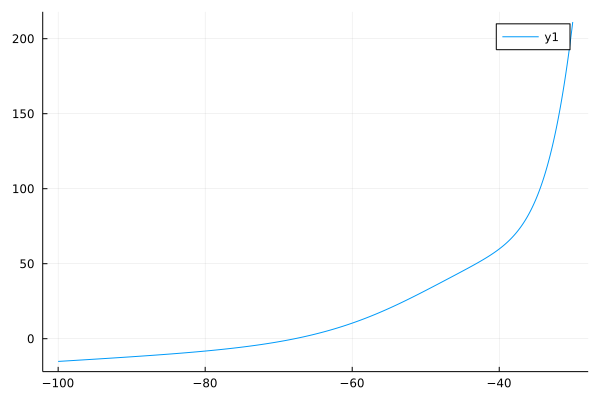

In [7]:
## Model IV curve
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

Vvec = range(-100.,-30.,length=1000);
Ivec = zeros(length(Vvec))
@. Ivec = -(-gNa*mNainf(Vvec)*hNainf(Vvec)*(Vvec-VNa) -gKd*mKdinf(Vvec)*(Vvec-VK) -gAf*mAfinf(Vvec)*hAfinf(Vvec)*(Vvec-VK) -gAs*mAsinf(Vvec)*hAsinf(Vvec)*(Vvec-VK) +
         -gCaL*mCaLinf(Vvec)*(Vvec-VCa) -gCaT*mCaTinf(Vvec)*hCaTinf(Vvec)*(Vvec-VCa) -gH*mHinf(Vvec)*(Vvec-VH) -gl*(Vvec-Vl))

plot(Vvec,Ivec)

## 1.1.1 Spike excitability and spiking
Blablabla

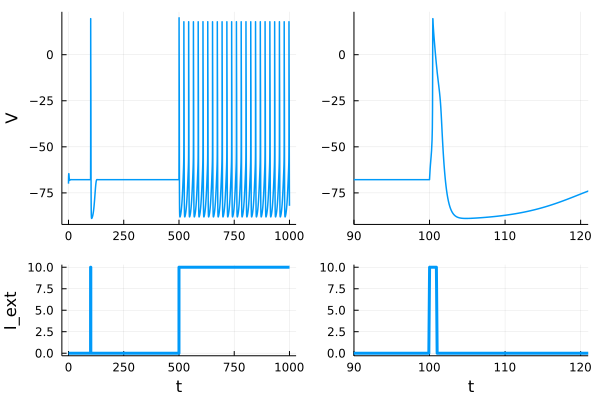

In [8]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=1000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=0.

# Current pulses
I1=10. # Amplitude of first pulse
ti1=100 # Starting time of first pulse
tf1=101. # Ending time of first pulse
I2= 10. # Amplitude of second pulse
ti2=500 # Starting time of second pulse
tf2=1001 # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob,dtmax=0.1)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(ti1-10,tf1+20))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(ti1-10,tf1+20))
xlabel!("t")

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)

#savefig(CC,"23-Currentclamp-pulse.pdf")

## 1.1.2 Slow spiking

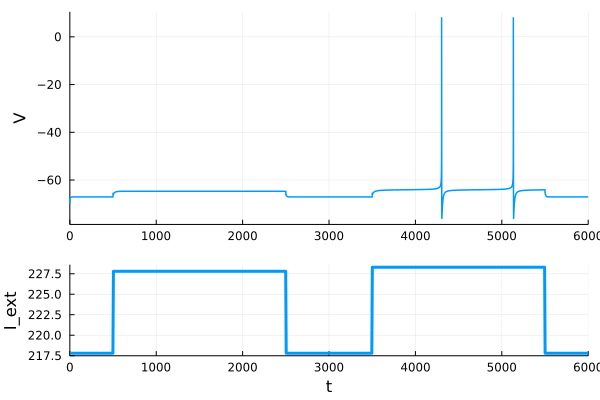

In [9]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; #1200 # Sodium current maximal conductance
gKd=65.; #1000 # Delayed-rectifier potassium current maximal conductance
gAf=15.0; # 2 #Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=6000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=217.8

# Current pulses
I1=10. # 10 # Amplitude of first pulse
ti1=500 # Starting time of first pulse
tf1=2500 # Ending time of first pulse
I2=10.5 # 10.1 #Amplitude of second pulse
ti2=3500 # Starting time of second pulse
tf2=5500 # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

# Input current
t=range(0.0,Tfinal,length=1000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

l = @layout [
    a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}
]

CC = plot(p1,p2,layout=l,legend=false)
xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

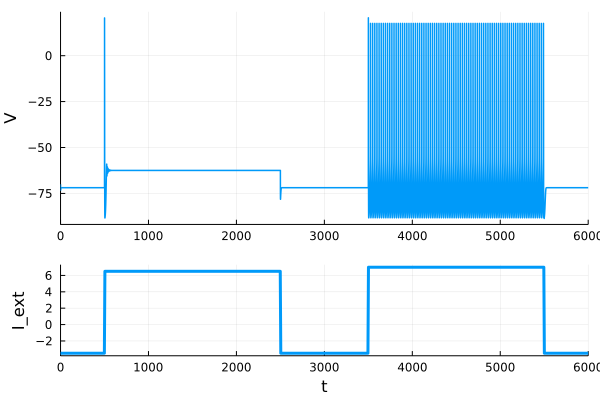

In [10]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=6000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=-3.5

# Current pulses
I1=10. # Amplitude of first pulse
ti1=500 # Starting time of first pulse
tf1=2500 # Ending time of first pulse
I2=10.5 # Amplitude of second pulse
ti2=3500 # Starting time of second pulse
tf2=5500 # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

# Input current
t=range(0.0,Tfinal,length=1000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

l = @layout [
    a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}
]

CC = plot(p1,p2,layout=l,legend=false)
xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

## 1.1.3 Burst excitability and bursting

In [11]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=8.; # Calcium-activated potassium current maximal conductance
gCaL=4.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=8000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=-0.

# Current pulses
I1=10. # Amplitude of first pulse
ti1=3000 # Starting time of first pulse
tf1=3020 # Ending time of first pulse
I2=4. # Amplitude of second pulse
ti2=5000 # Starting time of second pulse
tf2=8001 # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob,dtmax=0.1)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(ti1-50,tf1+320))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(ti1-50,tf1+320))
xlabel!("t")

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)
#xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

## 1.1.4 Rebound excitability

### Rebound spiking with $I_H$

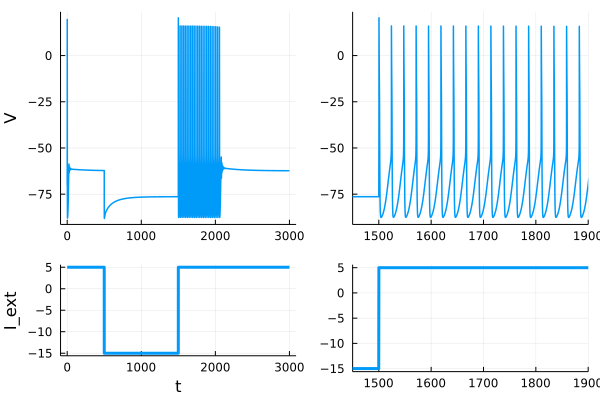

In [12]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=0.; # T-type calcium current maximal conductance
gH=0.8; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=3000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=5.

# Current pulses
I1=-20. # Amplitude of first pulse
ti1=500 # Starting time of first pulse
tf1=1500 # Ending time of first pulse
I2=-20. # Amplitude of second pulse
ti2=000. # Starting time of second pulse
tf2=0000. # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(tf1-50,tf1+400))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(tf1-50,tf1+400))

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)
#xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

### Rebound spiking with $I_{Ca,T}$

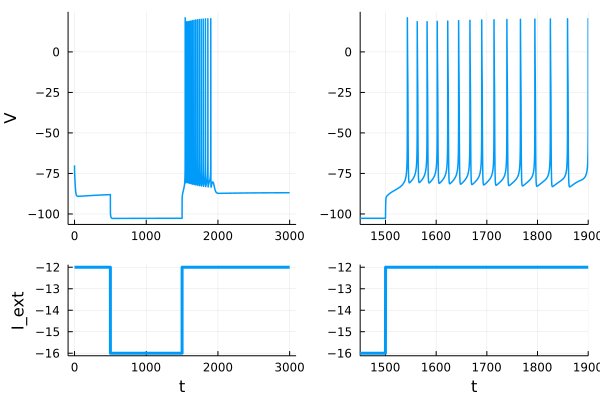

In [13]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=0.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=2.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=3000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=-12.

# Current pulses
I1=-4. # Amplitude of first pulse
ti1=500 # Starting time of first pulse
tf1=1500 # Ending time of first pulse
I2=-20. # Amplitude of second pulse
ti2=000. # Starting time of second pulse
tf2=0000. # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(tf1-50,tf1+400))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(tf1-50,tf1+400))
xlabel!("t")

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)
#xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

### Rebound bursting with $I_{Ca,T}$

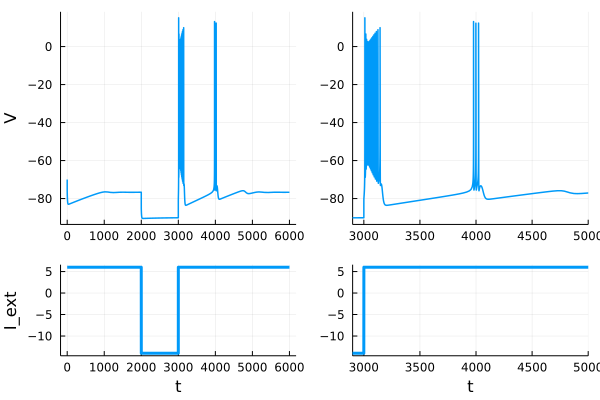

In [14]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=0.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=35.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=6.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))*2

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=6000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=6.

# Current pulses
I1=-20. # Amplitude of first pulse
ti1=2000 # Starting time of first pulse
tf1=3000 # Ending time of first pulse
I2=-20. # Amplitude of second pulse
ti2=000. # Starting time of second pulse
tf2=0000. # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(tf1-100,tf1+2000))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(tf1-100,tf1+2000))
xlabel!("t")

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)
#xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")

## 1.1.5 Hyperpolarization-induced bursting

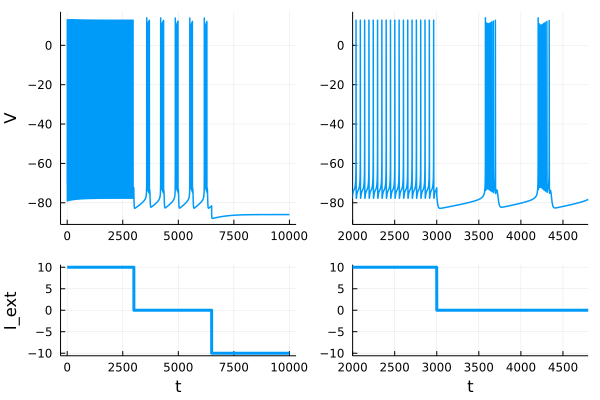

In [15]:
## Definition of maximal conductance values. 
gl=0.3; # Leak current maximal conductance
gNa=100.; # Sodium current maximal conductance
gKd=65.; # Delayed-rectifier potassium current maximal conductance
gAf=1.; # Fast A-type potassium current maximal conductance
gAs=0.; # Slow A-type potassium current maximal conductance
gKCa=20.; # Calcium-activated potassium current maximal conductance
gCaL=0.; # L-type calcium current maximal conductance
gCaT=8.; # T-type calcium current maximal conductance
gH=0.; # H-current maximal conductance

## Initial conditions
V0= -70.
mNa0=mNainf(V0) 
hNa0=hNainf(V0) 
mKd0=mKdinf(V0) 
mAf0=mAfinf(V0) 
hAf0=hAfinf(V0) 
mAs0=mAsinf(V0) 
hAs0=hAsinf(V0) 
mCaL0=mCaLinf(V0) 
mCaT0=mCaTinf(V0) 
hCaT0=hCaTinf(V0) 
mH0=mHinf(V0) 
Ca0=(-α*gCaL*mCaL0*(V0-VCa))+(-β*gCaT*mCaT0*hCaT0*(V0-VCa))

x0 = [V0; mNa0; hNa0; mKd0; mAf0; hAf0; mAs0; hAs0; mCaL0; mCaT0; hCaT0; mH0; Ca0]

## Definition of simulation time.
Tfinal=10000.0
tspan=(0.0,Tfinal)


## Input current defition
# Constant current
Iapp=10.

# Current pulses
I1=-10. # Amplitude of first pulse
ti1=3000 # Starting time of first pulse
tf1=6500 # Ending time of first pulse
I2=-20. # Amplitude of second pulse
ti2=6500 # Starting time of second pulse
tf2=10001 # Ending time of first pulse


## Current-clamp experiment
# Parameter vector for simulations
p=(Iapp,I1,I2,ti1,tf1,ti2,tf2,gNa,gKd,gAf,gAs,gKCa,gCaL,gCaT,gH,gl)

# Simulation
prob = ODEProblem(CBM_ODE,x0,tspan,p) # Simulation without noise (ODE)
sol = solve(prob)


## Generation of figures 
# Voltage response
p1=plot(sol.t, sol[1,:],linewidth=1.5,legend=false)
ylabel!("V")

p1zoom=plot(sol.t, sol[1,:],linewidth=1.5,legend=false,xlims=(ti1-1000,ti1+1800))

# Input current
t=range(0.0,Tfinal,length=10000)
p2=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3)
xlabel!("t")
ylabel!("I_ext")

p2zoom=plot(t,Iapp .+I1*pulse.(t,ti1,tf1)+I2*pulse.(t,ti2,tf2),linewidth=3,xlims=(ti1-1000,ti1+1800))
xlabel!("t")

l = @layout [
    [a{1.0*w,0.7*h}
    b{1.0*w,0.3*h}] [c{1.0*w,0.7*h}
                d{1.0*w,0.3*h}]
]

CC = plot(p1,p2,p1zoom,p2zoom,layout=l,legend=false)
#xlims!(0,Tfinal)
#ylims!(-80,-60)

#savefig(CC,"23-Currentclamp-pulse.pdf")